# weatherAUS IEEE Day

This is for IEEE Competition. We were given 3 dataset (train, test and validation) of weatherAUS. Our motivation for this project is to find out which attributes affect if it will rain and how can we predict if it will rain given attributes like Location, MinTemp, MaxTemp, Rainfall and more.

In [32]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [33]:
full_dataframe = pd.read_csv("weatherAUS_Train_Set.csv", index_col=0, parse_dates=True)
full_dataframe

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
1,12/1/08,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,12/2/08,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12/3/08,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,12/4/08,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,12/5/08,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102257,9/2/16,MountGambier,5.5,16.3,0.8,NaN,NaN,E,30.0,E,...,79.0,53.0,1012.9,1008.6,NaN,3.0,11.5,15.4,No,No
102258,9/3/16,MountGambier,5.3,13.3,0.0,NaN,NaN,W,59.0,NNW,...,80.0,73.0,1009.3,1010.1,NaN,4.0,11.7,12.4,No,Yes
102259,9/4/16,MountGambier,8.0,15.3,4.2,NaN,NaN,NW,44.0,NNW,...,91.0,63.0,1023.2,1024.0,5.0,8.0,12.1,14.6,Yes,No


In [34]:
full_dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,101055.0,12.021216,6.390850,-8.5,7.4,12.0,16.9,33.9
MaxTemp,101235.0,22.686006,6.876903,-4.8,17.7,22.4,27.5,47.3
Rainfall,99692.0,2.513042,9.010921,0.0,0.0,0.0,0.8,371.0
Evaporation,57487.0,5.153268,3.905991,0.0,2.4,4.4,7.0,145.0
Sunshine,50166.0,7.291620,3.831655,0.0,4.3,8.1,10.4,14.5
WindGustSpeed,95760.0,39.690925,13.942264,7.0,30.0,37.0,48.0,135.0
WindSpeed9am,100758.0,13.792761,9.143453,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,100147.0,18.750577,9.205945,0.0,13.0,19.0,24.0,87.0
Humidity9am,100171.0,71.016512,17.743800,3.0,59.0,71.0,84.0,100.0
Humidity3pm,99749.0,53.550903,20.157169,1.0,39.0,54.0,67.0,100.0


# 1. Data Preparation

In [35]:
print("Data type : ", type(full_dataframe))
print("Data dims : ", full_dataframe.shape)
full_dataframe.info()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (102261, 23)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 102261 entries, 1 to 102261
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           102261 non-null  object 
 1   Location       102261 non-null  object 
 2   MinTemp        101055 non-null  float64
 3   MaxTemp        101235 non-null  float64
 4   Rainfall       99692 non-null   float64
 5   Evaporation    57487 non-null   float64
 6   Sunshine       50166 non-null   float64
 7   WindGustDir    95750 non-null   object 
 8   WindGustSpeed  95760 non-null   float64
 9   WindDir9am     93888 non-null   object 
 10  WindDir3pm     99218 non-null   object 
 11  WindSpeed9am   100758 non-null  float64
 12  WindSpeed3pm   100147 non-null  float64
 13  Humidity9am    100171 non-null  float64
 14  Humidity3pm    99749 non-null   float64
 15  Pressure9am    91594 non-null   float64
 1

# Cleaning of data by checking if there's null

In [8]:
full_dataframe.Location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier'],
      dtype=object)

In [9]:
full_dataframe.RainToday.unique()

array(['No', 'Yes', nan], dtype=object)

In [10]:
full_dataframe.RainTomorrow.unique()

array(['No', 'Yes', nan], dtype=object)

In [11]:
full_dataframe["RainTomorrow"]

Row
1          No
2          No
3          No
4          No
5          No
         ... 
102257     No
102258    Yes
102259     No
102260     No
102261     No
Name: RainTomorrow, Length: 102261, dtype: object

In [12]:
full_dataframe.isnull().sum() # check if null

Date                 0
Location             0
MinTemp           1206
MaxTemp           1026
Rainfall          2569
Evaporation      44774
Sunshine         52095
WindGustDir       6511
WindGustSpeed     6501
WindDir9am        8373
WindDir3pm        3043
WindSpeed9am      1503
WindSpeed3pm      2114
Humidity9am       2090
Humidity3pm       2512
Pressure9am      10667
Pressure3pm      10622
Cloud9am         40129
Cloud3pm         41276
Temp9am           1571
Temp3pm           2051
RainToday         2569
RainTomorrow      2568
dtype: int64

Given a dataset, our aim is to predict RainTomorrow accuracy. We are now in the data preperation phase. Besides date and location, there are empty fields in other variables. If RainTomorrow is empty, then there is no way we can use our model to train and predict RainTomorrow.

Other variables seems to be able to provide us essential data to predict RainTomorrow, so no need to drop columns.

In [13]:
# remove empty RainTomorrow
clean_dataframe = full_dataframe[full_dataframe['RainTomorrow'].notna()]
clean_dataframe.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
1,12/1/08,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,12/2/08,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12/3/08,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,12/4/08,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,12/5/08,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [14]:
clean_dataframe.isnull().sum() # check if null

Date                 0
Location             0
MinTemp            461
MaxTemp            220
Rainfall          1108
Evaporation      43476
Sunshine         50506
WindGustDir       5738
WindGustSpeed     5729
WindDir9am        7929
WindDir3pm        2683
WindSpeed9am      1167
WindSpeed3pm      1770
Humidity9am       1298
Humidity3pm       1715
Pressure9am       9707
Pressure3pm       9662
Cloud9am         38363
Cloud3pm         39503
Temp9am            794
Temp3pm           1265
RainToday         1108
RainTomorrow         0
dtype: int64

In [15]:
clean_dataframe.RainTomorrow.unique()

array(['No', 'Yes'], dtype=object)

In [16]:
clean_dataframe["RainTomorrow"]

Row
1          No
2          No
3          No
4          No
5          No
         ... 
102257     No
102258    Yes
102259     No
102260     No
102261     No
Name: RainTomorrow, Length: 99693, dtype: object

In [17]:
clean_dataframe.describe

<bound method NDFrame.describe of            Date      Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
Row                                                                      
1       12/1/08        Albury     13.4     22.9       0.6          NaN   
2       12/2/08        Albury      7.4     25.1       0.0          NaN   
3       12/3/08        Albury     12.9     25.7       0.0          NaN   
4       12/4/08        Albury      9.2     28.0       0.0          NaN   
5       12/5/08        Albury     17.5     32.3       1.0          NaN   
...         ...           ...      ...      ...       ...          ...   
102257   9/2/16  MountGambier      5.5     16.3       0.8          NaN   
102258   9/3/16  MountGambier      5.3     13.3       0.0          NaN   
102259   9/4/16  MountGambier      8.0     15.3       4.2          NaN   
102260   9/5/16  MountGambier     10.4     15.9       0.8          NaN   
102261   9/6/16  MountGambier      4.8     19.0       0.2          NaN   

   

In [18]:
print("Reduction of",102261-99693, "Rows of Data")

Reduction of 2568 Rows of Data


In [19]:
# changing yes no into 1/0
from sklearn.preprocessing import LabelEncoder
colslabel =['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','RainTomorrow']
clean_dataframe[colslabel] = clean_dataframe[colslabel].apply(LabelEncoder().fit_transform)
print(clean_dataframe)

           Date  Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
Row                                                                            
1       12/1/08         1     13.4     22.9       0.6          NaN       NaN   
2       12/2/08         1      7.4     25.1       0.0          NaN       NaN   
3       12/3/08         1     12.9     25.7       0.0          NaN       NaN   
4       12/4/08         1      9.2     28.0       0.0          NaN       NaN   
5       12/5/08         1     17.5     32.3       1.0          NaN       NaN   
...         ...       ...      ...      ...       ...          ...       ...   
102257   9/2/16        16      5.5     16.3       0.8          NaN       NaN   
102258   9/3/16        16      5.3     13.3       0.0          NaN       NaN   
102259   9/4/16        16      8.0     15.3       4.2          NaN       NaN   
102260   9/5/16        16     10.4     15.9       0.8          NaN       NaN   
102261   9/6/16        16      4.8     1

/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [20]:
clean_dataframe.isna().sum()

Date                 0
Location             0
MinTemp            461
MaxTemp            220
Rainfall          1108
Evaporation      43476
Sunshine         50506
WindGustDir          0
WindGustSpeed     5729
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1167
WindSpeed3pm      1770
Humidity9am       1298
Humidity3pm       1715
Pressure9am       9707
Pressure3pm       9662
Cloud9am         38363
Cloud3pm         39503
Temp9am            794
Temp3pm           1265
RainToday            0
RainTomorrow         0
dtype: int64

In [21]:
clean_dataframe['WindGustDir'].fillna(clean_dataframe['WindGustDir'].mode()[0], inplace=True)
clean_dataframe['WindDir9am'].fillna(clean_dataframe['WindDir9am'].mode()[0], inplace=True)
clean_dataframe['WindDir3pm'].fillna(clean_dataframe['WindDir3pm'].mode()[0], inplace=True)
clean_dataframe['RainToday'].fillna(clean_dataframe['RainToday'].mode()[0], inplace=True)
clean_dataframe['RainTomorrow'].fillna(clean_dataframe['RainTomorrow'].mode()[0], inplace=True)

/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [22]:
clean_dataframe.isna().sum()

Date                 0
Location             0
MinTemp            461
MaxTemp            220
Rainfall          1108
Evaporation      43476
Sunshine         50506
WindGustDir          0
WindGustSpeed     5729
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1167
WindSpeed3pm      1770
Humidity9am       1298
Humidity3pm       1715
Pressure9am       9707
Pressure3pm       9662
Cloud9am         38363
Cloud3pm         39503
Temp9am            794
Temp3pm           1265
RainToday            0
RainTomorrow         0
dtype: int64

In [25]:
clean_dataframe["TempDifference"] = clean_dataframe["MaxTemp"] - clean_dataframe["MinTemp"]

/var/folders/f1/b9jtl_x97kd8y5n9h1btlbj40000gn/T/ipykernel_1848/767761337.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_dataframe["TempDifference"] = clean_dataframe["MaxTemp"] - clean_dataframe["MinTemp"]


In [26]:
clean_dataframe.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
count,99693.000000,99232.000000,99473.000000,98585.000000,56217.000000,49187.000000,99693.000000,93964.000000,99693.00000,99693.000000,...,97978.000000,89986.000000,90031.000000,61330.000000,60190.000000,98899.000000,98428.000000,99693.000000,99693.000000,99090.000000
mean,16.379936,12.005503,22.681695,2.502725,5.150172,7.305412,8.243347,39.630507,8.43632,7.813618,...,53.527333,1017.992947,1015.641667,4.670651,4.709271,16.558410,21.191594,0.251151,0.232213,10.680835
std,9.905518,6.391192,6.868435,9.000009,3.900359,3.827316,4.920289,13.928700,4.83976,4.749028,...,20.156432,7.024109,6.935988,2.847343,2.676762,6.371761,6.683881,0.458590,0.422246,4.878683
min,0.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,0.000000,7.000000,0.00000,0.000000,...,1.000000,980.500000,979.000000,0.000000,0.000000,-7.200000,-5.400000,0.000000,0.000000,0.000000
25%,8.000000,7.400000,17.700000,0.000000,2.400000,4.400000,4.000000,30.000000,4.00000,4.000000,...,39.000000,1013.400000,1011.000000,2.000000,2.000000,11.900000,16.400000,0.000000,0.000000,6.900000
50%,16.000000,12.000000,22.400000,0.000000,4.400000,8.100000,9.000000,37.000000,9.00000,8.000000,...,54.000000,1018.000000,1015.600000,6.000000,5.000000,16.500000,20.900000,0.000000,0.000000,10.000000
75%,25.000000,16.900000,27.500000,0.800000,7.000000,10.400000,13.000000,48.000000,13.00000,12.000000,...,67.000000,1022.600000,1020.300000,7.000000,7.000000,21.200000,25.800000,0.000000,0.000000,14.000000
max,33.000000,33.900000,47.300000,371.000000,145.000000,14.500000,16.000000,135.000000,16.00000,16.000000,...,100.000000,1040.600000,1037.900000,9.000000,8.000000,38.600000,46.700000,2.000000,1.000000,31.200000


In [30]:
clean_dataframe.drop(["Sunshine","Evaporation"],axis = 1,inplace=True)

/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [31]:
clean_dataframe

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
Row,,,,,,,,,,,,,,,,,,,,,
1,12/1/08,1,13.4,22.9,0.6,13,44.0,13,14,20.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0,0,9.5
2,12/2/08,1,7.4,25.1,0.0,14,44.0,6,15,4.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0,0,17.7
3,12/3/08,1,12.9,25.7,0.0,15,46.0,13,15,19.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0,0,12.8
4,12/4/08,1,9.2,28.0,0.0,4,24.0,9,0,11.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0,0,18.8
5,12/5/08,1,17.5,32.3,1.0,13,41.0,1,7,7.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,14.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102257,9/2/16,16,5.5,16.3,0.8,0,30.0,0,8,19.0,...,53.0,1012.9,1008.6,NaN,3.0,11.5,15.4,0,0,10.8
102258,9/3/16,16,5.3,13.3,0.0,13,59.0,6,13,19.0,...,73.0,1009.3,1010.1,NaN,4.0,11.7,12.4,0,1,8.0
102259,9/4/16,16,8.0,15.3,4.2,7,44.0,6,14,13.0,...,63.0,1023.2,1024.0,5.0,8.0,12.1,14.6,1,0,7.3


<AxesSubplot:>

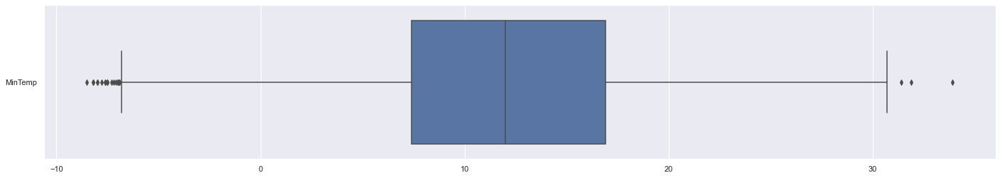

In [24]:
MinTemp =  pd.DataFrame(clean_dataframe['MinTemp'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=MinTemp,orient = "h")

<AxesSubplot:>

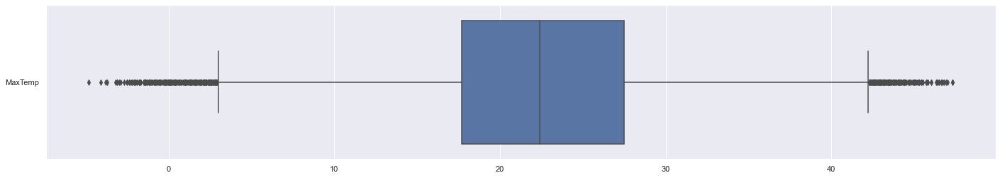

In [160]:
MaxTemp =  pd.DataFrame(clean_dataframe['MaxTemp'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=MaxTemp,orient = "h")

<AxesSubplot:>

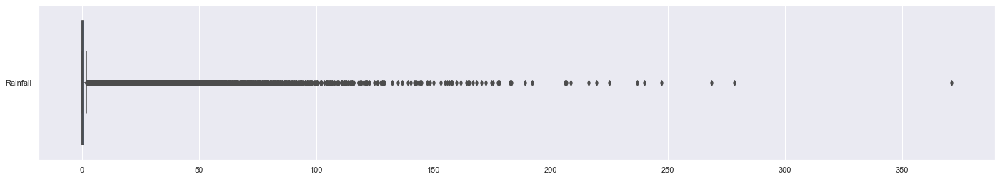

In [161]:
Rainfall =  pd.DataFrame(clean_dataframe['Rainfall'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=Rainfall,orient = "h")

<AxesSubplot:>

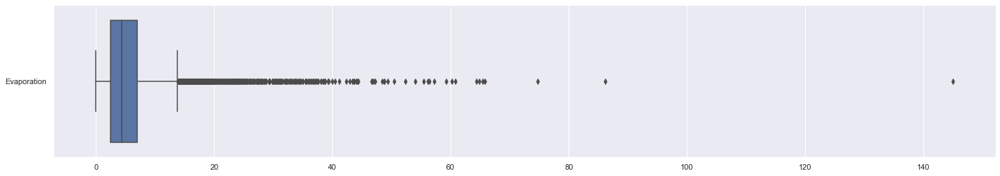

In [162]:
Evaporation =  pd.DataFrame(clean_dataframe['Evaporation'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=Evaporation,orient = "h")

<AxesSubplot:>

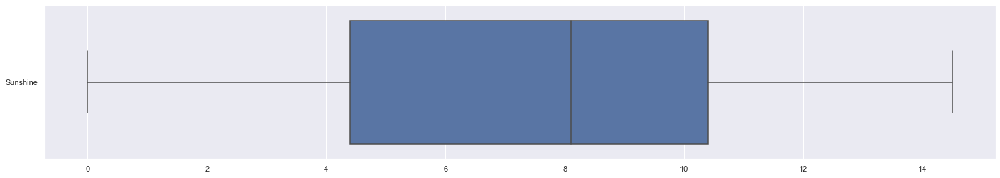

In [163]:
Sunshine =  pd.DataFrame(clean_dataframe['Sunshine'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=Sunshine,orient = "h")

<AxesSubplot:>

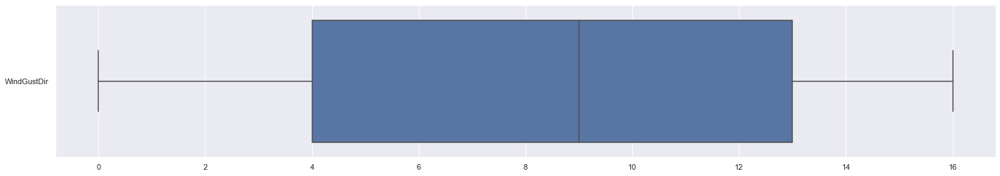

In [164]:
WindGustDir =  pd.DataFrame(clean_dataframe['WindGustDir'])

f = plt.figure(figsize=(24,4))
sb.boxplot(data=WindGustDir,orient = "h")

In [165]:
clean_dataframe.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 99693 entries, 1 to 102261
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           99693 non-null  object 
 1   Location       99693 non-null  int64  
 2   MinTemp        99232 non-null  float64
 3   MaxTemp        99473 non-null  float64
 4   Rainfall       98585 non-null  float64
 5   Evaporation    56217 non-null  float64
 6   Sunshine       49187 non-null  float64
 7   WindGustDir    99693 non-null  int64  
 8   WindGustSpeed  93964 non-null  float64
 9   WindDir9am     99693 non-null  int64  
 10  WindDir3pm     99693 non-null  int64  
 11  WindSpeed9am   98526 non-null  float64
 12  WindSpeed3pm   97923 non-null  float64
 13  Humidity9am    98395 non-null  float64
 14  Humidity3pm    97978 non-null  float64
 15  Pressure9am    89986 non-null  float64
 16  Pressure3pm    90031 non-null  float64
 17  Cloud9am       61330 non-null  float64
 18  Cloud

# Removing outliers
Q1 = Data.quantile(0.25) Q3 = Data.quantile(0.75) IQR = Q3 - Q1

Data_clean= Data[~((Data < (Q1 - 1.5 * IQR)) |(Data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [166]:
clean_dataframe

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
1,12/1/08,1,13.4,22.9,0.6,NaN,NaN,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0,0
2,12/2/08,1,7.4,25.1,0.0,NaN,NaN,14,44.0,6,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0,0
3,12/3/08,1,12.9,25.7,0.0,NaN,NaN,15,46.0,13,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0,0
4,12/4/08,1,9.2,28.0,0.0,NaN,NaN,4,24.0,9,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0,0
5,12/5/08,1,17.5,32.3,1.0,NaN,NaN,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102257,9/2/16,16,5.5,16.3,0.8,NaN,NaN,0,30.0,0,...,79.0,53.0,1012.9,1008.6,NaN,3.0,11.5,15.4,0,0
102258,9/3/16,16,5.3,13.3,0.0,NaN,NaN,13,59.0,6,...,80.0,73.0,1009.3,1010.1,NaN,4.0,11.7,12.4,0,1
102259,9/4/16,16,8.0,15.3,4.2,NaN,NaN,7,44.0,6,...,91.0,63.0,1023.2,1024.0,5.0,8.0,12.1,14.6,1,0


In [168]:
clean_dataframe['Location'].unique()


array([ 1,  2,  8,  9, 15, 18, 20, 21, 22, 24, 26, 27, 30, 32, 33,  7, 29,
       17,  3,  4, 25, 13, 12, 14, 19, 23, 31, 10,  5,  6, 11, 28,  0, 16])

# Split of data

In [169]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(clean_dataframe, test_size=0.2)

In [170]:
train

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
39631,4/3/09,32,17.8,27.9,0.8,2.6,9.5,1,30.0,1,...,96.0,70.0,1020.6,1016.0,2.0,6.0,21.0,26.1,0,0
81470,4/17/2010,10,8.5,26.7,0.0,2.4,6.0,7,33.0,4,...,69.0,35.0,1022.5,1019.5,NaN,NaN,17.0,26.4,0,1
96025,9/3/16,28,20.8,28.9,0.0,5.4,NaN,11,37.0,8,...,65.0,49.0,1016.4,1014.1,3.0,6.0,24.3,27.2,0,0
30570,2/28/2009,26,17.5,25.4,0.0,4.8,5.6,16,NaN,3,...,70.0,61.0,1009.5,1006.9,7.0,4.0,20.7,24.1,0,0
11080,10/12/14,9,17.0,24.8,0.0,NaN,NaN,16,NaN,16,...,65.0,61.0,NaN,NaN,NaN,NaN,21.9,23.4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92060,2/21/2014,11,24.7,29.8,0.0,NaN,NaN,10,50.0,2,...,80.0,78.0,1012.2,1010.6,NaN,NaN,28.0,27.3,0,0
35824,7/21/2015,27,7.9,20.1,1.0,0.8,9.9,3,37.0,7,...,76.0,46.0,1033.1,1029.2,1.0,1.0,12.2,18.8,0,0
87451,8/8/09,6,17.4,28.0,0.0,6.6,10.9,9,43.0,10,...,63.0,35.0,1015.8,1012.2,5.0,2.0,22.5,26.8,0,0


In [171]:
test

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
8239,3/29/2015,8,12.8,29.2,0.0,6.8,NaN,8,24.0,0,...,24.0,14.0,1021.7,1020.0,7.0,7.0,19.7,28.7,0,0
48164,2/17/2015,7,15.6,32.5,0.0,NaN,NaN,13,41.0,1,...,67.0,31.0,1017.6,1013.9,1.0,NaN,22.1,31.2,0,0
30727,8/4/09,26,10.0,19.8,0.0,3.2,5.1,16,NaN,13,...,70.0,33.0,1021.7,1017.4,7.0,3.0,11.7,18.2,0,0
52102,1/9/09,17,3.0,14.0,0.2,NaN,NaN,16,NaN,0,...,99.0,59.0,NaN,NaN,NaN,NaN,4.2,12.9,0,0
101321,2/9/14,16,16.4,22.3,0.0,10.4,10.0,13,70.0,15,...,63.0,36.0,1012.2,1017.2,3.0,3.0,17.4,21.5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45335,10/16/2016,33,14.8,25.7,0.0,NaN,NaN,4,61.0,4,...,52.0,65.0,1013.4,1006.8,NaN,NaN,19.6,21.5,0,0
79837,4/21/2014,31,9.9,19.6,0.0,4.4,3.4,3,59.0,5,...,56.0,43.0,1019.3,1016.1,7.0,7.0,14.8,18.5,0,0
21136,1/17/2009,21,16.2,23.4,0.0,5.8,9.6,7,30.0,14,...,65.0,62.0,1015.0,1013.4,1.0,7.0,21.0,22.1,0,1


In [182]:
# Extract only the numeric data variables

compare_numDF = pd.DataFrame(train[["Location", "MinTemp", "MaxTemp", "Rainfall", "Evaporation", "Sunshine", "WindGustDir", "WindGustSpeed", "WindDir9am", "WindDir3pm", "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am", "Pressure3pm", "Cloud9am", "Cloud3pm", "Temp9am", "Temp3pm", "RainToday", "RainTomorrow"]])

# Summary Statistics for all Variables
compare_numDF.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,79754.000000,79383.000000,79581.000000,78857.000000,44937.000000,39395.000000,79754.000000,75133.000000,79754.000000,79754.000000,...,78738.000000,78373.000000,71945.000000,71982.000000,49054.000000,48185.000000,79128.000000,78721.000000,79754.000000,79754.000000
mean,16.413960,12.009526,22.663196,2.523115,5.136046,7.290118,8.233593,39.592909,8.440968,7.802555,...,71.066486,53.605145,1018.005132,1015.651710,4.676071,4.714766,16.553688,21.176836,0.251787,0.233343
std,9.900306,6.391544,6.853386,9.091572,3.884992,3.827638,4.923092,13.933968,4.844017,4.747310,...,17.738340,20.114502,7.024470,6.937389,2.847623,2.677928,6.365046,6.662140,0.459224,0.422961
min,0.000000,-8.200000,-4.800000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,...,5.000000,1.000000,986.200000,982.600000,0.000000,0.000000,-7.200000,-5.400000,0.000000,0.000000
25%,8.000000,7.400000,17.600000,0.000000,2.400000,4.300000,4.000000,30.000000,4.000000,4.000000,...,59.000000,39.000000,1013.400000,1011.000000,2.000000,2.000000,11.900000,16.400000,0.000000,0.000000
50%,16.000000,12.000000,22.400000,0.000000,4.400000,8.100000,9.000000,37.000000,9.000000,8.000000,...,71.000000,54.000000,1018.000000,1015.600000,6.000000,5.000000,16.500000,20.900000,0.000000,0.000000
75%,25.000000,16.900000,27.500000,0.800000,7.000000,10.400000,13.000000,48.000000,13.000000,12.000000,...,85.000000,67.000000,1022.700000,1020.300000,7.000000,7.000000,21.200000,25.700000,0.000000,0.000000
max,33.000000,33.900000,47.300000,371.000000,145.000000,14.500000,16.000000,135.000000,16.000000,16.000000,...,100.000000,100.000000,1040.600000,1037.900000,9.000000,8.000000,38.600000,46.700000,2.000000,1.000000


In [183]:
# Calculate the complete  correlation matrix
compare_numDF.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.053043,-0.030028,0.015903,0.018811,-0.020172,-0.003312,0.087351,-0.006614,-0.060224,...,0.032476,0.083346,-0.002934,0.000158,0.020364,-0.004444,0.012770,-0.030421,0.013534,0.009130
MinTemp,0.053043,1.000000,0.731806,0.115179,0.480073,0.049465,-0.150844,0.158214,-0.129670,-0.216240,...,-0.232752,0.055520,-0.422086,-0.419826,0.091152,0.016898,0.914538,0.706048,0.077735,0.107329
MaxTemp,-0.030028,0.731806,1.000000,-0.059476,0.579581,0.446553,-0.184782,0.040737,-0.214749,-0.217109,...,-0.449841,-0.468323,-0.321219,-0.403166,-0.260726,-0.270087,0.870165,0.983920,-0.185434,-0.133998
Rainfall,0.015903,0.115179,-0.059476,1.000000,-0.048810,-0.213220,0.028589,0.132088,0.042156,0.035876,...,0.215484,0.249262,-0.151425,-0.116113,0.185877,0.157290,0.029261,-0.061032,0.488912,0.231148
Evaporation,0.018811,0.480073,0.579581,-0.048810,1.000000,0.325779,-0.076438,0.200549,-0.117538,-0.082710,...,-0.472664,-0.330994,-0.275642,-0.286403,-0.142742,-0.149600,0.546990,0.558577,-0.165658,-0.087711
Sunshine,-0.020172,0.049465,0.446553,-0.213220,0.325779,1.000000,-0.061990,-0.055761,-0.059856,-0.068195,...,-0.462983,-0.617213,0.039757,-0.012911,-0.673019,-0.707319,0.253639,0.469269,-0.301833,-0.441493
WindGustDir,-0.003312,-0.150844,-0.184782,0.028589,-0.076438,-0.061990,1.000000,0.165812,0.357207,0.581438,...,-0.001586,-0.025528,-0.125740,-0.041393,0.013897,0.035634,-0.183211,-0.200611,0.094696,0.025200
WindGustSpeed,0.087351,0.158214,0.040737,0.132088,0.200549,-0.055761,0.165812,1.000000,-0.069995,0.150706,...,-0.205034,-0.000007,-0.453625,-0.405371,0.081853,0.129009,0.133661,0.003739,0.150263,0.232124
WindDir9am,-0.006614,-0.129670,-0.214749,0.042156,-0.117538,-0.059856,0.357207,-0.069995,1.000000,0.285329,...,0.129630,0.091296,0.055895,0.125809,0.049309,0.010665,-0.187049,-0.213753,0.107959,-0.020229
WindDir3pm,-0.060224,-0.216240,-0.217109,0.035876,-0.082710,-0.068195,0.581438,0.150706,0.285329,1.000000,...,0.008050,-0.063476,-0.116384,-0.017363,0.040303,0.068353,-0.241914,-0.230579,0.099299,0.008645


<AxesSubplot:>

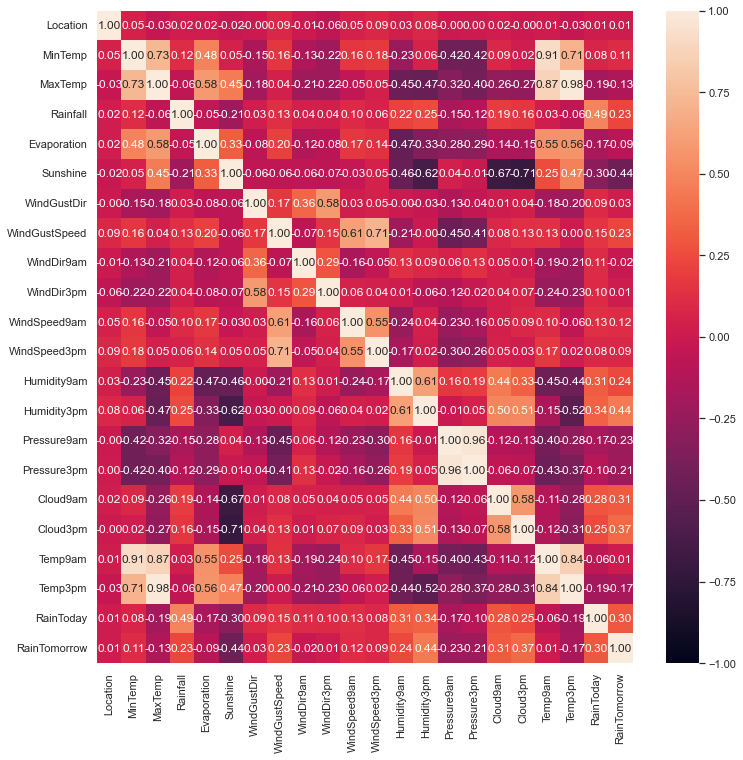

In [184]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(compare_numDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")


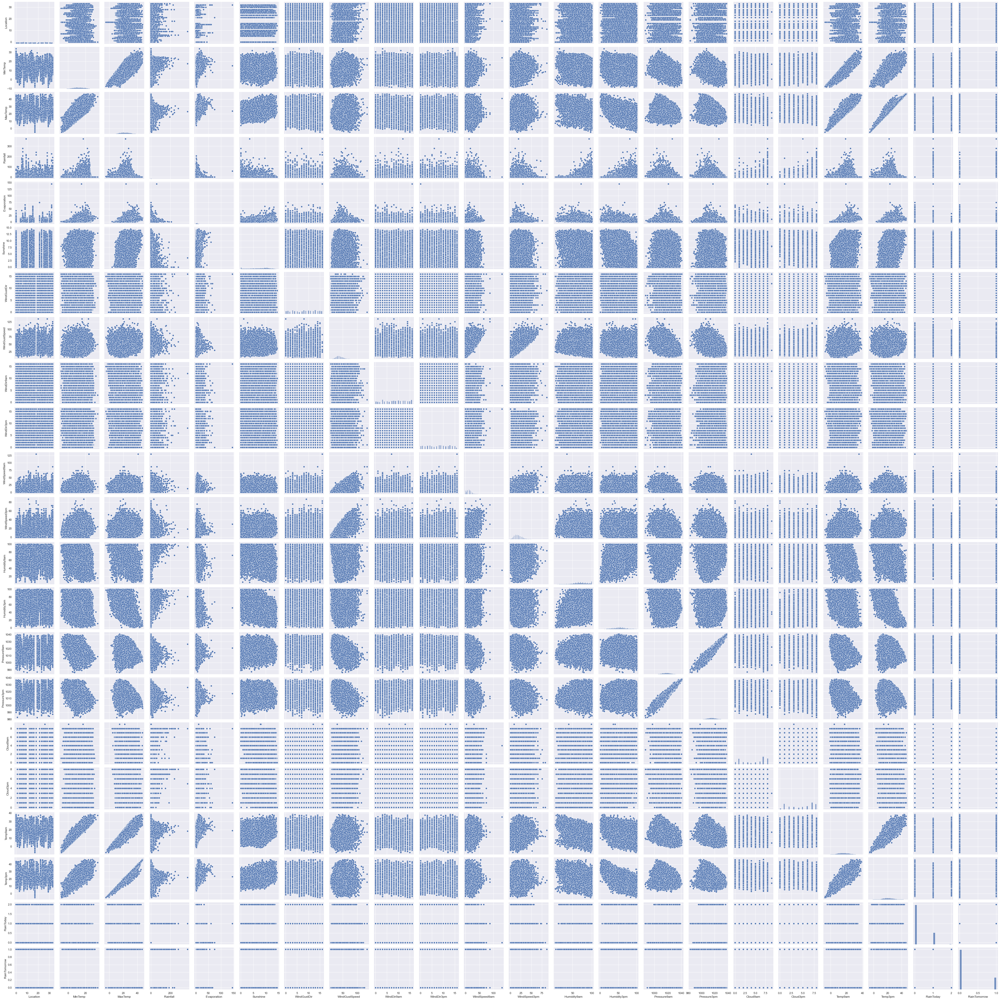

In [185]:
# Draw pairs of variables against one another
sb.pairplot(data = compare_numDF)

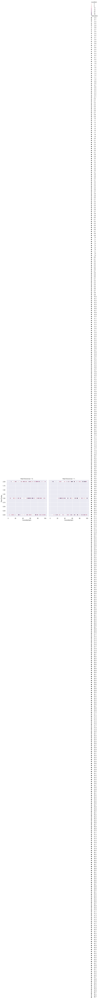

In [186]:
sns.relplot(
    data=train, x="Humidity3pm", y="RainToday",
    col="RainTomorrow", hue="Location", style="Temp3pm",
    kind="scatter"
)

In [187]:
#Separating columns to be visualized
out_cols = list(set(train.nunique()[train.nunique()<6].keys().tolist()
                    + train.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in train.columns if x not in out_cols] + ['Churn']

sns.pairplot(train[viz_cols], diag_kind="kde")
plt.show()

KeyError: "['Churn'] not in index"

7     2750
26    2714
5     2544
28    2448
0     2443
23    2431
29    2419
4     2417
9     2413
1     2411
33    2411
22    2398
30    2395
27    2394
21    2393
8     2392
3     2392
11    2385
24    2381
14    2378
18    2376
13    2375
25    2374
31    2372
6     2358
10    2341
20    2332
17    2322
2     2306
15    2289
16    2200
32    2033
12    1925
19    1242
Name: Location, dtype: int64


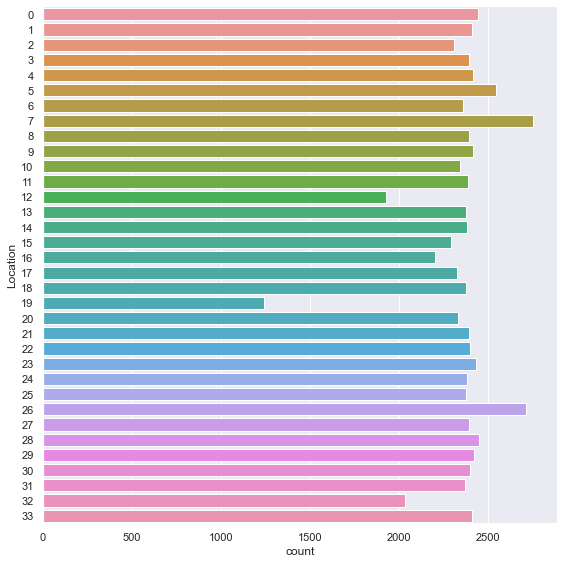

In [188]:
print(train["Location"].value_counts())
sb.catplot(y = "Location", data = train, kind = "count", height = 8)